# Backtest Crypto Agent
 
This notebook demonstrates how to train and backtest a reinforcement learning agent for cryptocurrency trading using the `CryptoTradingEnv` environment.


In [8]:
%load_ext autoreload
%autoreload 2


In [24]:
import sys
import os

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from stable_baselines3 import PPO
from rl_agent.trading_env import CryptoTradingEnv
from rl_agent.data_processing import download_data, add_technical_indicators

In [6]:
def train_agent(env, total_timesteps=10000):
    model = PPO('MlpPolicy', env, verbose=1)
    model.learn(total_timesteps=total_timesteps)
    return model

In [40]:
def backtest_agent(env, model, max_steps=None):
    obs = env.reset()
    done = False
    portfolio_values = [env.initial_amount]
    step_count = 0
    
    while not done:
        action, _states = model.predict(obs)
        obs, reward, done, info = env.step(action)
        portfolio_values.append(env.asset_memory[-1])  # Append the latest portfolio value
        step_count += 1
        
        # Break if we've reached the maximum number of steps or the end of the data
        if max_steps and step_count >= max_steps:
            break
        if env.day >= len(env.df) - 1:
            break

    # Calculate and print backtest metrics
    metrics = env.calculate_backtest_metrics()
    print('Backtest Results:')
    print(f'Total Return: {metrics["total_return"]:.2%}')
    print(f'Sharpe Ratio: {metrics["sharpe_ratio"]:.2f}')
    print(f'Max Drawdown: {metrics["max_drawdown"]:.2%}')
    print(f'Total Steps: {step_count}')
    
    return metrics, portfolio_values

In [25]:
df = download_data(start_date='2022-01-01', end_date='2023-01-01', symbols=['BTC/USD'])
df = add_technical_indicators(df)
print(df.head())
print(f"Data shape: {df.shape}")

       tic                 timestamp      open      high       low     close  \
1  BTC/USD 2022-01-02 01:00:00-05:00  47087.56  47992.00  46668.46  47098.88   
2  BTC/USD 2022-01-03 01:00:00-05:00  47102.58  47568.95  45700.83  46154.60   
3  BTC/USD 2022-01-04 01:00:00-05:00  46153.00  47527.78  45547.55  46314.83   
4  BTC/USD 2022-01-05 01:00:00-05:00  46303.77  47066.70  42460.00  43051.65   
5  BTC/USD 2022-01-06 01:00:00-05:00  43061.81  43588.75  40957.53  41846.64   

        volume  trade_count          vwap        macd       boll_ub  \
1   443.889422      22218.0  47195.450479    0.072019  47101.814626   
2   783.384691      29891.0  46514.267285  -29.190300  47871.562063   
3   850.111475      29224.0  46453.886975  -35.998952  47670.552436   
4  1882.128273      58070.0  44573.054825 -168.790246  49290.907886   
5  1166.578757      40734.0  42496.153736 -296.970060  49749.652203   

        boll_lb      rsi_30      cci_30    adx  close_30_sma  close_60_sma  
1  47092.735374

In [26]:
train_env = CryptoTradingEnv(
    df=df,
    crypto_dim=1,
    hmax=100,
    initial_amount=10000,
    buy_cost_pct=0.001,
    sell_cost_pct=0.001,
    reward_scaling=1e-4,
    state_space=7,  # Adjust based on your actual state space
    action_space=1,
    tech_indicator_list=['rsi_30', 'macd', 'cci_30', 'adx'],
    mode='train'
)

DataFrame shape: (364, 17)
Columns: Index(['tic', 'timestamp', 'open', 'high', 'low', 'close', 'volume',
       'trade_count', 'vwap', 'macd', 'boll_ub', 'boll_lb', 'rsi_30', 'cci_30',
       'adx', 'close_30_sma', 'close_60_sma'],
      dtype='object')
State space: 7
Crypto dim: 1
Tech indicators: ['rsi_30', 'macd', 'cci_30', 'adx']
Initiated state: [10000, 47098.88, 0, 100.0, 0.07201923076354433, -66.66666666666667, 100.0]
Initiated state length: 7
Final initiated state: [10000, 47098.88, 0, 100.0, 0.07201923076354433, -66.66666666666667, 100.0]
Final initiated state length: 7


In [27]:
trained_model = train_agent(train_env, total_timesteps=50000)

Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.
Initiated state: [10000, 47098.88, 0, 100.0, 0.07201923076354433, -66.66666666666667, 100.0]
Initiated state length: 7
Final initiated state: [10000, 47098.88, 0, 100.0, 0.07201923076354433, -66.66666666666667, 100.0]
Final initiated state length: 7
Updated state: [-9.999999999998181, 46154.6, 0.21231927383411242, 0.32753384850680334, -29.19029950247932, -99.9999999999993, 100.0]
Updated state length: 7
Final updated state: [-9.999999999998181, 46154.6, 0.21231927383411242, 0.32753384850680334, -29.19029950247932, -99.9999999999993, 100.0]
Final updated state length: 7
Updated state: [9779.711644947824, 46314.83, 0.0, 15.169560850440831, -35.99895245837979, -67.63486152224726, 100.0]
Updated state length: 7
Final updated state: [9779.711644947824, 46314.83, 0.0, 15.169560850440831, -35.99895245837979, -67.63486152224726, 100.0]
Final updated state length: 7
Updated state: [9779.711644947824, 

/home/rcgalbo/rl-agent/rla/lib/python3.10/site-packages/stable_baselines3/common/vec_env/patch_gym.py:49: UserWarning: You provided an OpenAI Gym environment. We strongly recommend transitioning to Gymnasium environments. Stable-Baselines3 is automatically wrapping your environments in a compatibility layer, which could potentially cause issues.
  warnings.warn(


Updated state: [-9.111380511031553e-06, 38148.42, 0.25288324401832435, 34.76264683217859, -1252.3542516763628, -70.61784059378147, 44.448458883910845]
Updated state length: 7
Final updated state: [-9.111380511031553e-06, 38148.42, 0.25288324401832435, 34.76264683217859, -1252.3542516763628, -70.61784059378147, 44.448458883910845]
Final updated state length: 7
Updated state: [9.111380511030048e-09, 37022.16, 0.252883243779484, 32.37452001448932, -1222.7069251114954, -82.34995591660466, 40.21869654104777]
Updated state length: 7
Final updated state: [9.111380511030048e-09, 37022.16, 0.252883243779484, 32.37452001448932, -1222.7069251114954, -82.34995591660466, 40.21869654104777]
Final updated state length: 7
Updated state: [-9.111380511028592e-12, 38466.1, 0.2528832437797301, 38.021537016618474, -1079.779299176509, -61.489182990062716, 34.6780578341737]
Updated state length: 7
Final updated state: [-9.111380511028592e-12, 38466.1, 0.2528832437797301, 38.021537016618474, -1079.77929917650

In [30]:
backtest_env = CryptoTradingEnv(
    df=df,
    crypto_dim=1,
    hmax=100,
    initial_amount=10000,
    buy_cost_pct=0.001,
    sell_cost_pct=0.001,
    reward_scaling=1e-4,
    state_space=7,  # Adjust based on your actual state space
    action_space=1,
    tech_indicator_list=['rsi_30', 'macd', 'cci_30', 'adx'],
    mode='backtest'
)

DataFrame shape: (364, 17)
Columns: Index(['tic', 'timestamp', 'open', 'high', 'low', 'close', 'volume',
       'trade_count', 'vwap', 'macd', 'boll_ub', 'boll_lb', 'rsi_30', 'cci_30',
       'adx', 'close_30_sma', 'close_60_sma'],
      dtype='object')
State space: 7
Crypto dim: 1
Tech indicators: ['rsi_30', 'macd', 'cci_30', 'adx']
Initiated state: [10000, 47098.88, 0, 100.0, 0.07201923076354433, -66.66666666666667, 100.0]
Initiated state length: 7
Final initiated state: [10000, 47098.88, 0, 100.0, 0.07201923076354433, -66.66666666666667, 100.0]
Final initiated state length: 7


In [42]:
metrics, portfolio_values = backtest_agent(backtest_env, trained_model, max_steps=df.shape[0])


Initiated state: [10000, 47098.88, 0, 100.0, 0.07201923076354433, -66.66666666666667, 100.0]
Initiated state length: 7
Final initiated state: [10000, 47098.88, 0, 100.0, 0.07201923076354433, -66.66666666666667, 100.0]
Final initiated state length: 7
Backtest Results:
Total Return: 0.00%
Sharpe Ratio: nan
Max Drawdown: 0.00%
Total Steps: 364


/home/rcgalbo/rl-agent/examples/../rl_agent/trading_env.py:344: RuntimeWarning: invalid value encountered in scalar divide
  


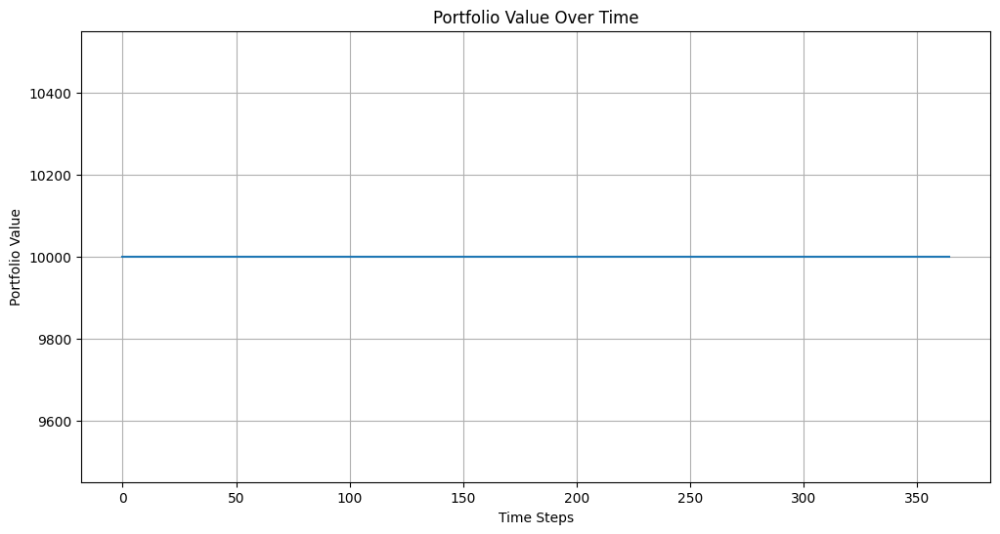

In [45]:
%matplotlib inline

plt.figure(figsize=(12, 6))
plt.plot(portfolio_values)
plt.title('Portfolio Value Over Time')
plt.xlabel('Time Steps')
plt.ylabel('Portfolio Value')
plt.grid(True)